<a href="https://colab.research.google.com/github/broadinstitute/BEClust3D/blob/add_qc/BEClust3D_v1_MultiScreen_SingleGene.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preliminary Steps

In [1]:
# @title Imports
# @markdown Import BEClust3D from Github and other necessary packages
! pip uninstall beclust3d -y
! pip install git+https://github.com/broadinstitute/BEClust3D.git@add_qc
! pip install pandas
! pip install numpy
! pip install matplotlib

Found existing installation: beclust3d 2024.0.0
Uninstalling beclust3d-2024.0.0:
  Successfully uninstalled beclust3d-2024.0.0
  Cloning https://github.com/broadinstitute/BEClust3D.git (to revision add_qc) to /tmp/pip-req-build-dxbwuewi
  Running command git clone --filter=blob:none --quiet https://github.com/broadinstitute/BEClust3D.git /tmp/pip-req-build-dxbwuewi
  Running command git checkout -b add_qc --track origin/add_qc
  Switched to a new branch 'add_qc'
  Branch 'add_qc' set up to track remote branch 'add_qc' from 'origin'.
  Resolved https://github.com/broadinstitute/BEClust3D.git to commit b2e313dfa999a883dc2058a8206d8cbaec032c23
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for beclust3d: filename=beclust3d-2024.0.0-py3-none-any.whl size=7816339 sha256=4d8870b052b014a95894495c791cf0b0422e80630eca575e03f5936769a93cf6
  Stored in directory: /tmp/pip-ephem-wheel-cache-45ahg

In [2]:
# @title Imports
# @markdown
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
# @title Import Google Drive
# @markdown Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# @markdown If files are in Google Drive, add 'drive/' in front of path
workdir = 'drive/MyDrive/beclust3d/' # @param {type:"string"}

In [5]:
# @markdown Separate screen file names by comma


screens = 'Human_InVitro_294T_Apobec_D14_Input.txt, Human_InVitro_294T_TadA_D14_Input.txt, Human_InVitro_SK-ES_Apobec_D14_Input.txt, Human_InVitro_SK-ES_TadA_D17_Input.txt, Human_InVitro_SW480_Apobec_D14_Input.txt, Human_InVitro_SW480_TadA_D14_Input.txt, Mouse_InVivo_B16_Apobec_NSG_Input.txt, Mouse_InVivo_B16_Apobec_Tx_NSG.txt, Mouse_InVivo_B16_TadA_NSG_Input.txt, Mouse_InVivo_B16_TadA_Tx_NSG.txt, Mouse_InVivo_LLC_Apobec_NSG_Input.txt, Mouse_InVivo_LLC_Apobec_Tx_NSG.txt' # @param {type:"string"}
screens = screens.split(', ')

input_gene = 'SETDB1' # @param {type:"string"}
input_uniprot = 'Q15047' # @param {type:"string"}
structureid = f"AF-{input_uniprot}-F1-model_v4"

# Formatting Data for Input (Optional)

In [6]:
# @markdown Check input columns are in an appropriate format

# @markdown If MUT_COL and EDITS_COL are a list of mutations and edits as opposed to one category, this code chunk reformats them into separate rows. Otherwise, an error is thrown.

def count_commas(s):
    if pd.isna(s):
        return 0
    return s.count(',')

mut_list_col = "Mutation_Category" # @param {type:"string"}
mut_col = "Histogram_Category" # @param {type:"string"}
val_col = "Input" # @param {type:"string"}
gene_col = "TargetGeneSymbol" # @param {type:"string"}
edits_col = "AminoAcidEdits" # @param {type:"string"}
gRNA_col = "gRNA_seq" # @param {type:"string"}

# @markdown If your data does not have a single mutation type for each score \
# @markdown Establish a hierarchy for mutation type importance \
# @markdown This will overwrite the MUT_COL column of your dataframe

assign_hierachy = False #@param {type: "boolean"}
hierachy = "Nonsense, Splice Site, Missense, Intron, Silent, UTR, Flank, No Mutation" # @param {type:"string"}
hierachy_list = [x.strip() for x in hierachy.split(',')]
mutation_hierarchy = {mutation: idx for idx, mutation in enumerate(hierachy_list)}

# Function to determine the Mutation_Category based on Mutation_Type
def prioritize_mutations(mutation_types):
    if not mutation_types or pd.isna(mutation_types):
        return "No Mutation"
    mutation_list = mutation_types.split(',')

    # Replace "Splice-donor" and "Splice-acceptor" with "Splice Site"
    mutation_list = ["Splice Site" if "Splice" in mutation else mutation for mutation in mutation_list]
    # Filter out mutation types not in the hierarchy list
    mutation_list = [mutation for mutation in mutation_list if mutation in mutation_hierarchy]

    # If no recognized mutation types are found, return an empty string
    if not mutation_list:
        return ""
    # Sort the mutations based on the defined hierarchy
    mutation_list.sort(key=lambda x: mutation_hierarchy.get(x, float('inf')))

    return mutation_list[0]

# CHECK INPUT #
for i, screen in enumerate(screens):
  df_screen = pd.read_csv(f'{workdir}rawdata/{screen}', sep='\t')
  assert all(x in df_screen.columns for x in [mut_list_col, mut_col, val_col, gene_col, edits_col]), "Input column(s) are not in the dataframe"
  # assert all(x in df_screen.columns for x in [mut_list_col, mut_col, val_col, gene_col, edits_col, gRNA_col]), "Input column(s) are not in the dataframe"

  # CHECK VAL_COL a list of values
  assert all(isinstance(x, float) for x in df_screen[val_col]), "val_col is not an float"

  # CHECK GENE_COL a list of gene names
  unique_genes = df_screen[gene_col].unique()
  unique_genes.sort()
  print(f'All genes present in screen {screen}', unique_genes)
  assert all(isinstance(x, str) for x in df_screen[gene_col]), "gene_col is not a string"

  # # CHECK gRNA_COL
  # assert all(isinstance(x, str) for x in df_screen[gRNA_col]), "gRNA_col is not a string"
  # assert all(len(x)==20 for x in df_screen[gRNA_col]), "gRNA_col should be 20 bps"

  # CHECK MUT_LIST_COL and EDITS_COL MATCH
  mismatch_rows = df_screen[df_screen[mut_list_col].apply(lambda x: count_commas(x)) != df_screen[edits_col].apply(lambda x: count_commas(x))]
  assert mismatch_rows.empty, "MUT_LIST_COL and EDITS_COL do not match"
  if not mismatch_rows.empty:
    print('Check the following rows')
    print(df_screen[mismatch_rows])

  # PRIORITIZE MUT_COL BASED ON MUT_LIST_COL
  if assign_hierachy:
    df_screen[mut_col] = df_screen[mut_list_col].apply(lambda x: prioritize_mutations(x))
    new_screen = screen.split('.')[0]+'_prioritized.'+screen.split('.')[1]
    print(screen, 'renamed to', new_screen)
    df_screen.to_csv(f'{workdir}rawdata/{new_screen}', sep='\t', index=False)
    screens[i] = new_screen


All genes present in screen Human_InVitro_294T_Apobec_D14_Input.txt ['ATF7IP' 'ATF7IP2' 'EHMT1' 'EHMT2' 'MORC2' 'MPHOSPH8' 'PPHLN1' 'PTPN2'
 'SETDB1' 'SETDB2' 'SUV39H1' 'SUV39H2' 'TASOR' 'TRIM28']
All genes present in screen Human_InVitro_294T_TadA_D14_Input.txt ['ATF7IP' 'ATF7IP2' 'EHMT1' 'EHMT2' 'MORC2' 'MPHOSPH8' 'PPHLN1' 'PTPN2'
 'SETDB1' 'SETDB2' 'SUV39H1' 'SUV39H2' 'TASOR' 'TRIM28']
All genes present in screen Human_InVitro_SK-ES_Apobec_D14_Input.txt ['ATF7IP' 'ATF7IP2' 'EHMT1' 'EHMT2' 'MORC2' 'MPHOSPH8' 'PPHLN1' 'PTPN2'
 'SETDB1' 'SETDB2' 'SUV39H1' 'SUV39H2' 'TASOR' 'TRIM28']
All genes present in screen Human_InVitro_SK-ES_TadA_D17_Input.txt ['ATF7IP' 'ATF7IP2' 'EHMT1' 'EHMT2' 'MORC2' 'MPHOSPH8' 'PPHLN1' 'PTPN2'
 'SETDB1' 'SETDB2' 'SUV39H1' 'SUV39H2' 'TASOR' 'TRIM28']
All genes present in screen Human_InVitro_SW480_Apobec_D14_Input.txt ['ATF7IP' 'ATF7IP2' 'EHMT1' 'EHMT2' 'MORC2' 'MPHOSPH8' 'PPHLN1' 'PTPN2'
 'SETDB1' 'SETDB2' 'SUV39H1' 'SUV39H2' 'TASOR' 'TRIM28']
All genes presen

# Preprocess Screens, and Query Structure and Conservation

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


Count of Nonsense rows: 33
Count of Splice Site rows: 19
Count of Missense rows: 282
Count of No Mutation rows: 168
Count of Silent rows: 109
Count of Nonsense rows: 2
Count of Splice Site rows: 16
Count of Missense rows: 334
Count of No Mutation rows: 151
Count of Silent rows: 94
Count of Nonsense rows: 33
Count of Splice Site rows: 19
Count of Missense rows: 282
Count of No Mutation rows: 168
Count of Silent rows: 109
Count of Nonsense rows: 2
Count of Splice Site rows: 16
Count of Missense rows: 334
Count of No Mutation rows: 151
Count of Silent rows: 94
Count of Nonsense rows: 33
Count of Splice Site rows: 19
Count of Missense rows: 282
Count of No Mutation rows: 168
Count of Silent rows: 109
Count of Nonsense rows: 2
Count of Splice Site rows: 16
Count of Missense rows: 334
Count of No Mutation rows: 151
Count of Silent rows: 94
Count of Nonsense rows: 28
Count of Splice Site rows: 20
Count of Missense rows: 255
Count of No Mutation rows: 214
Count of Silent rows: 91
Count of Nons

{'Human_InVitro_294T_Apobec_D14_Input': {'Nonsense':    this_edit edit_pos refAA altAA    LFC
  4       Q70*       70     Q     * -0.531
  5      Q273*      273     Q     * -0.404
  6      Q436*      436     Q     * -0.306
  13     R616*      616     R     * -0.205
  14     R390*      390     R     * -1.034
  17     Q148*      148     Q     * -0.839
  18     Q888*      888     Q     * -0.143
  20    Q1084*     1084     Q     *  0.826
  21     R616*      616     R     * -0.004
  22      Q26*       26     Q     *  0.220
  24     Q758*      758     Q     *  0.273
  25      Q70*       70     Q     * -1.853
  28     R366*      366     R     * -1.389
  29     R495*      495     R     *  0.848
  31    Q1122*     1122     Q     * -0.058,
  'Splice Site': 0    -0.389
  1    -0.665
  2    -0.689
  3    -1.405
  4     0.168
  5     0.290
  6    -1.214
  7    -2.226
  8    -0.891
  9    -0.677
  10   -0.405
  11   -0.522
  12    0.814
  13    1.233
  14    0.389
  15   -0.271
  16    1.121
  17   

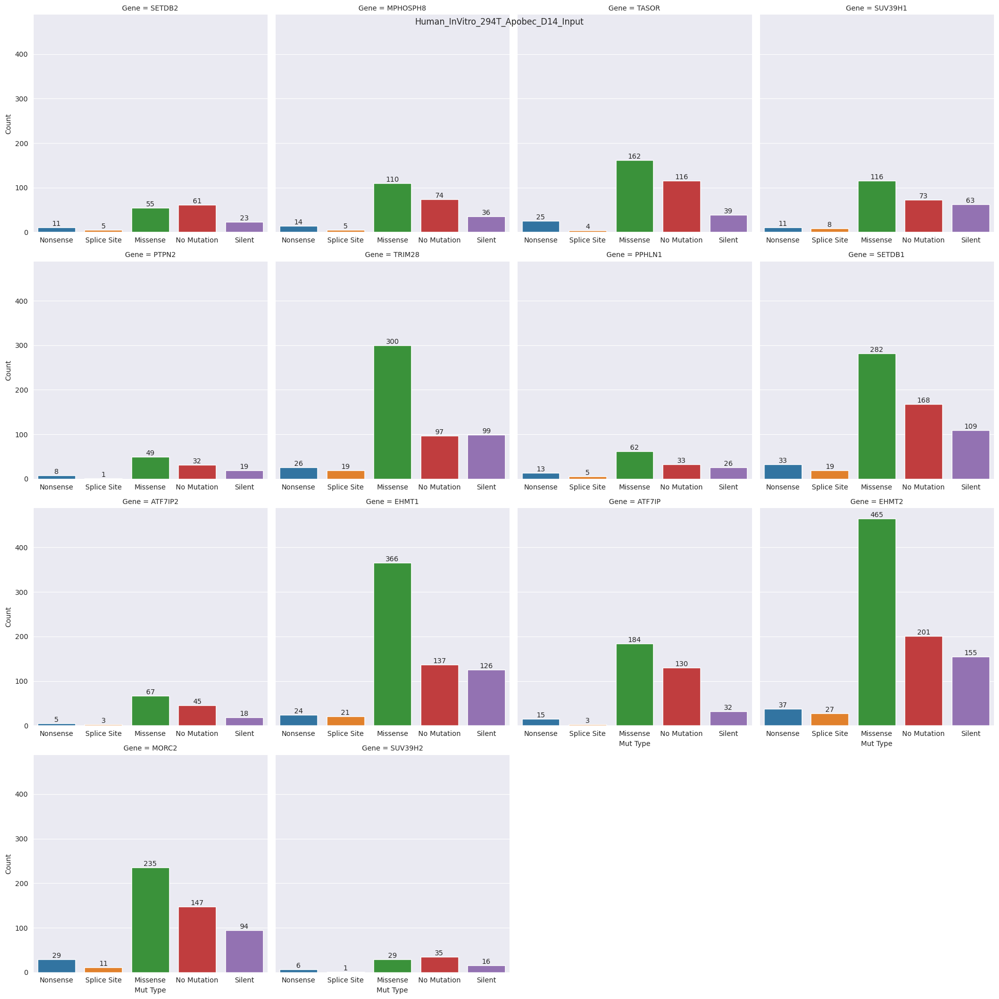

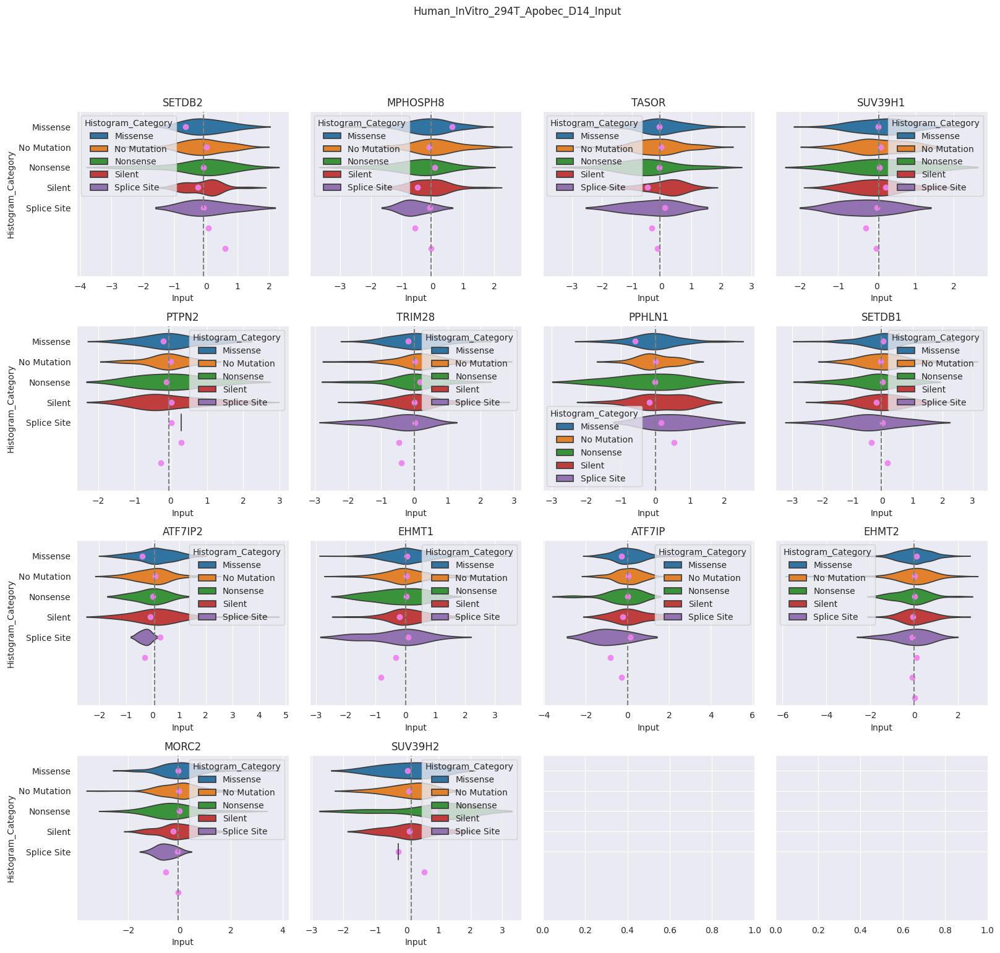

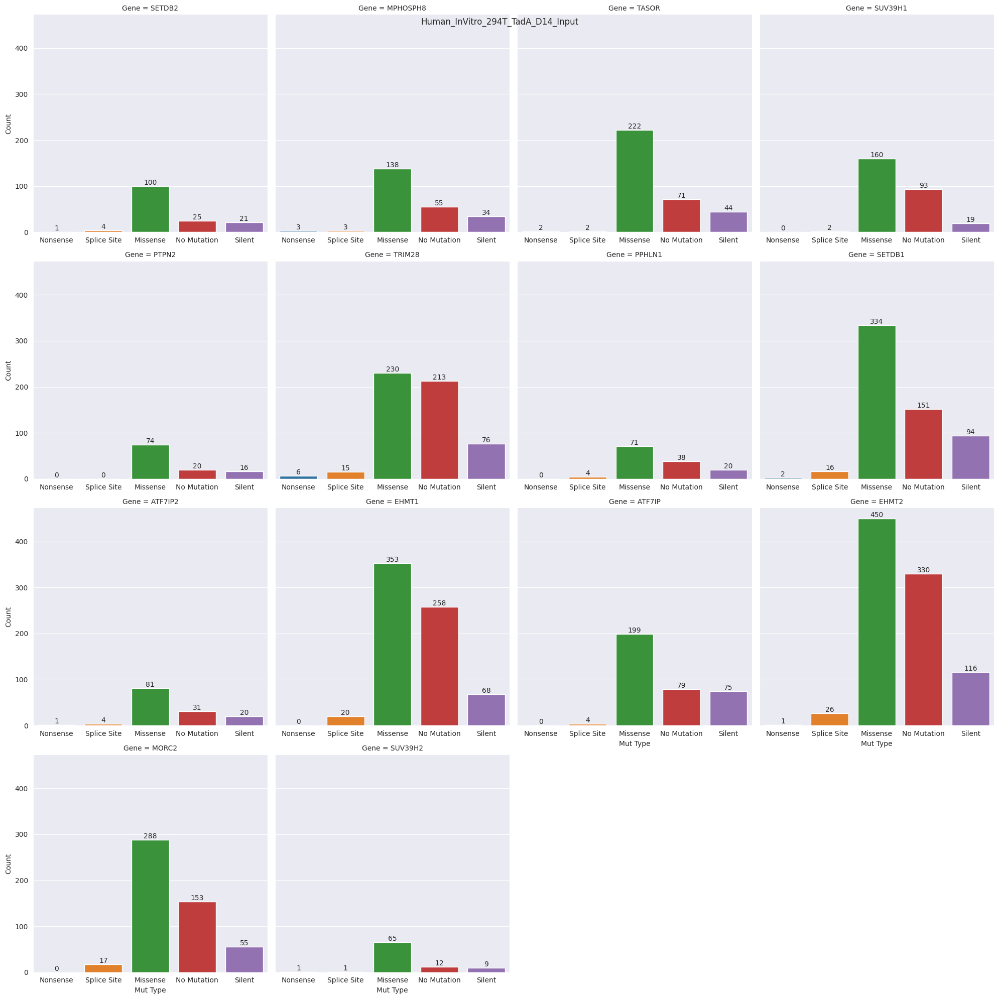

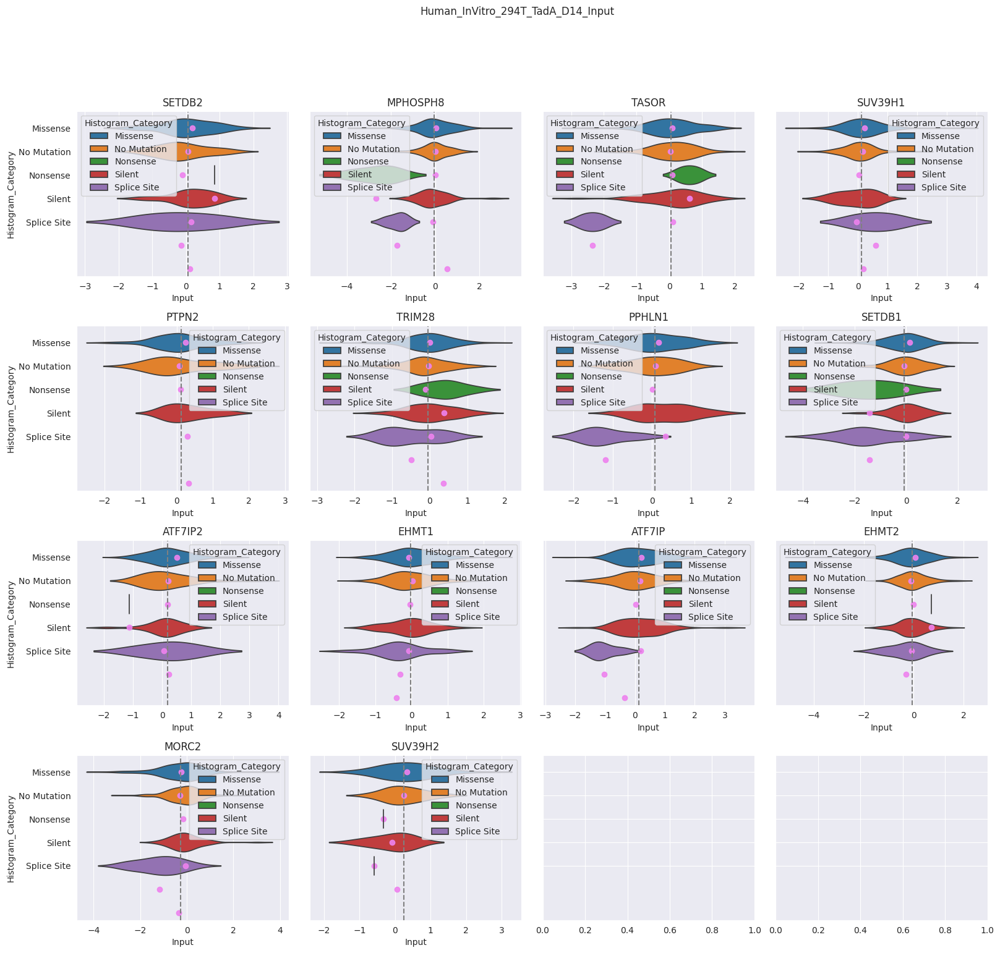

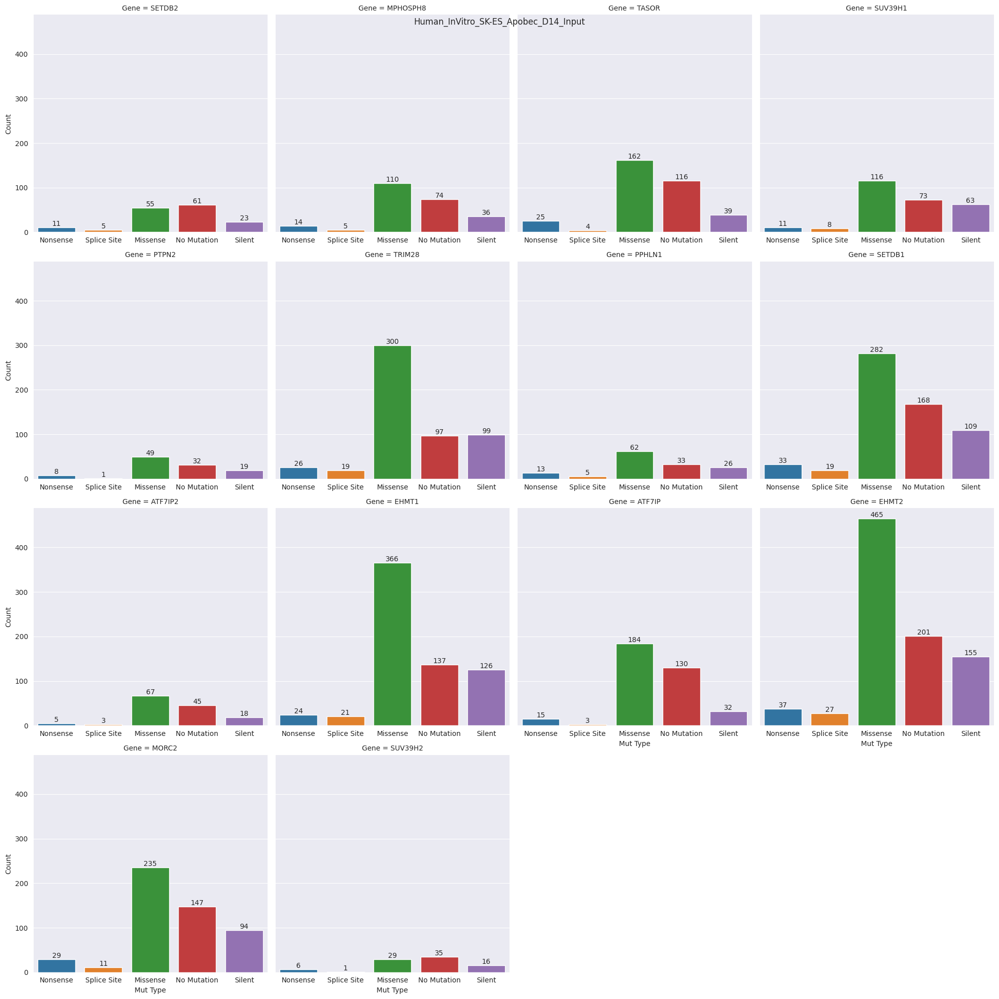

...

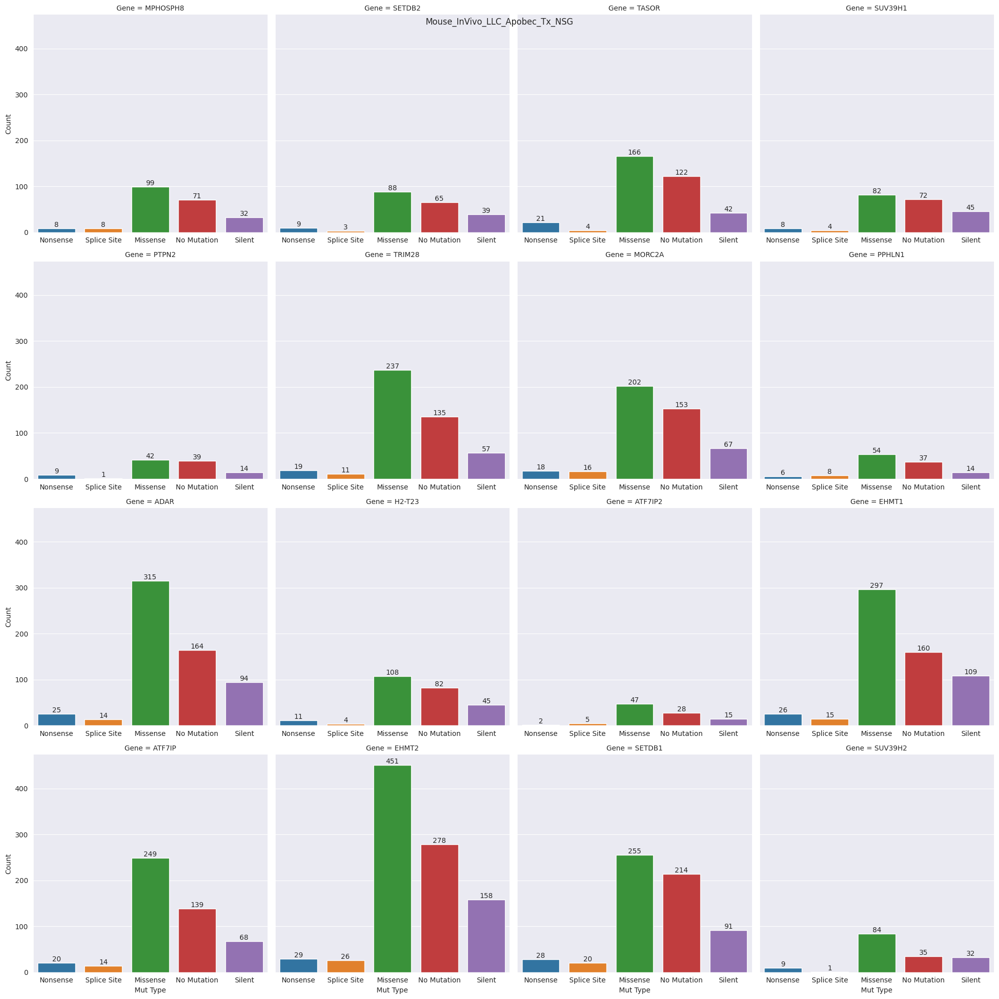

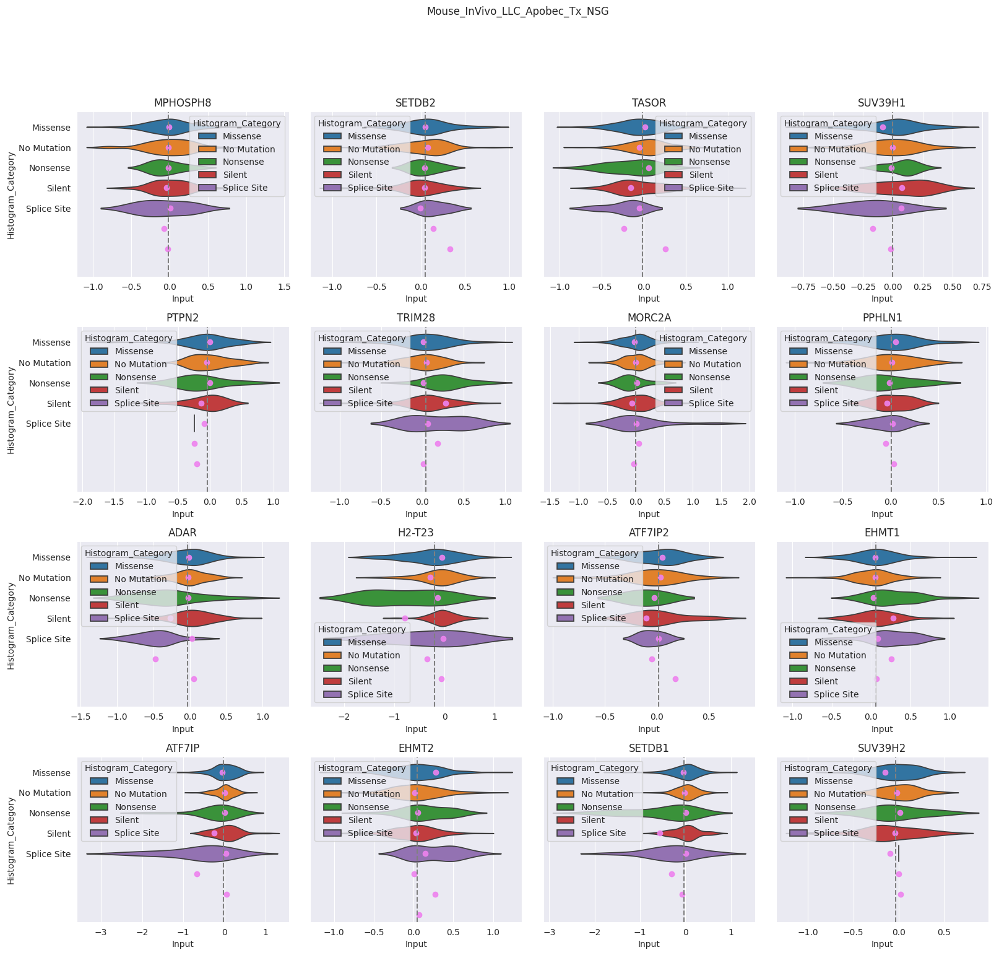

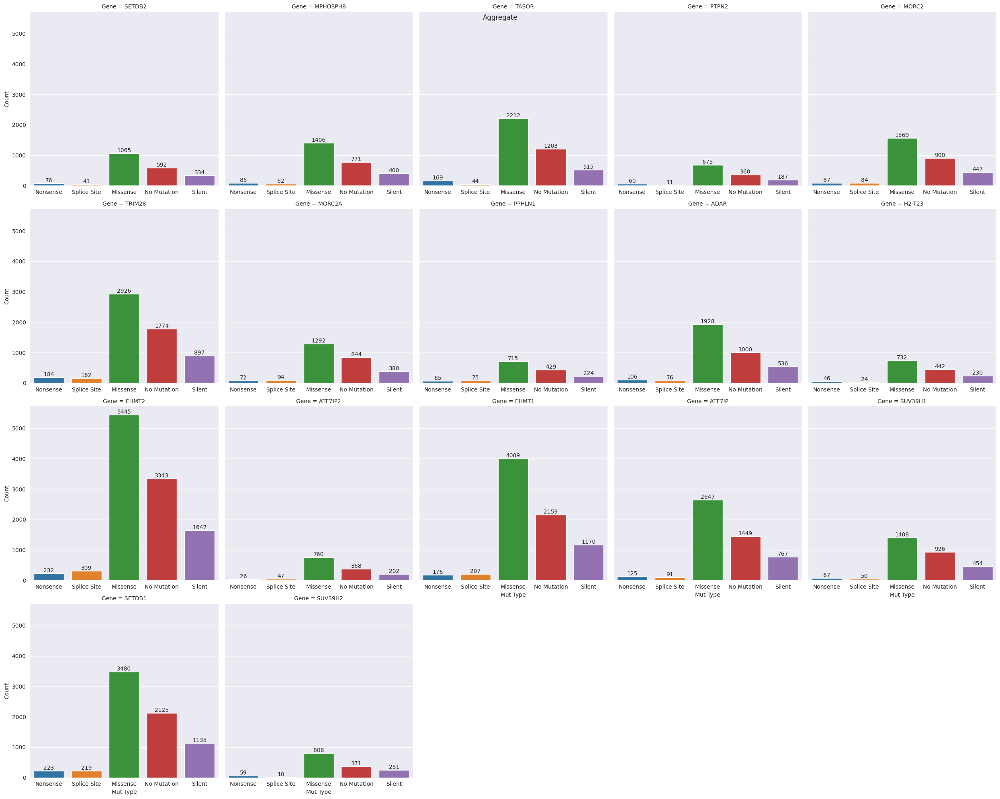

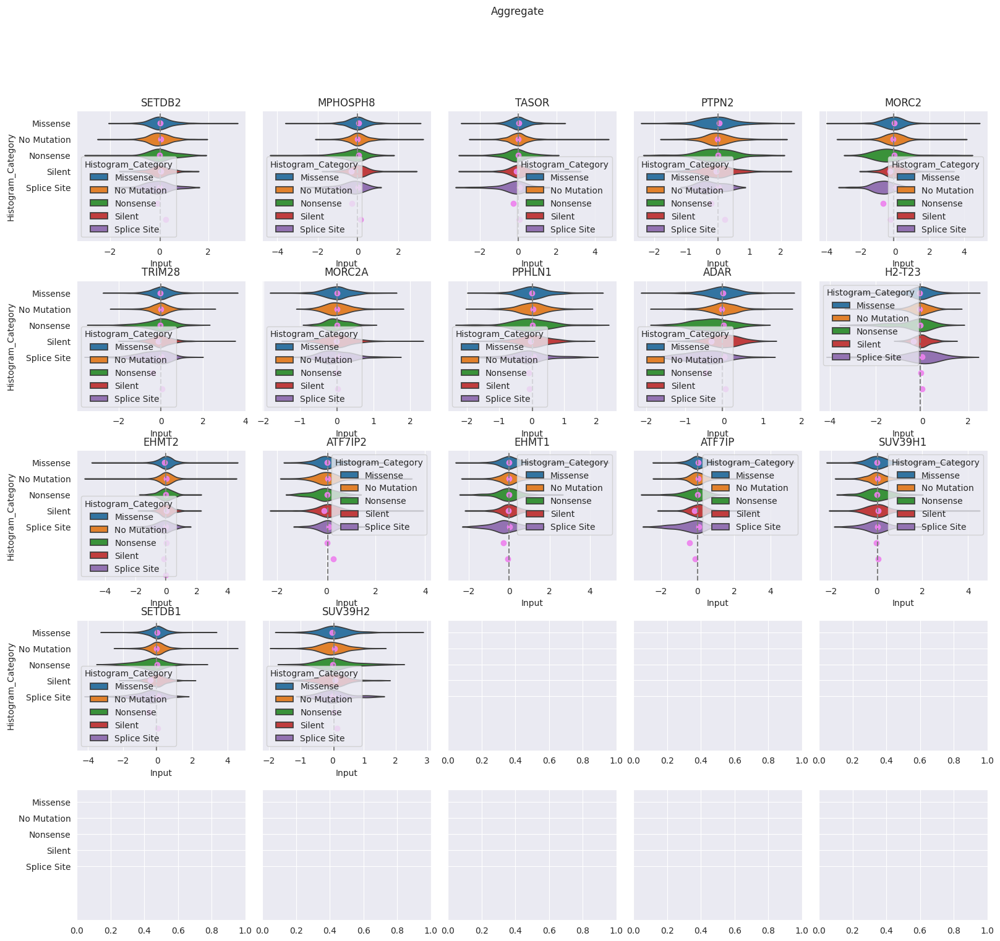

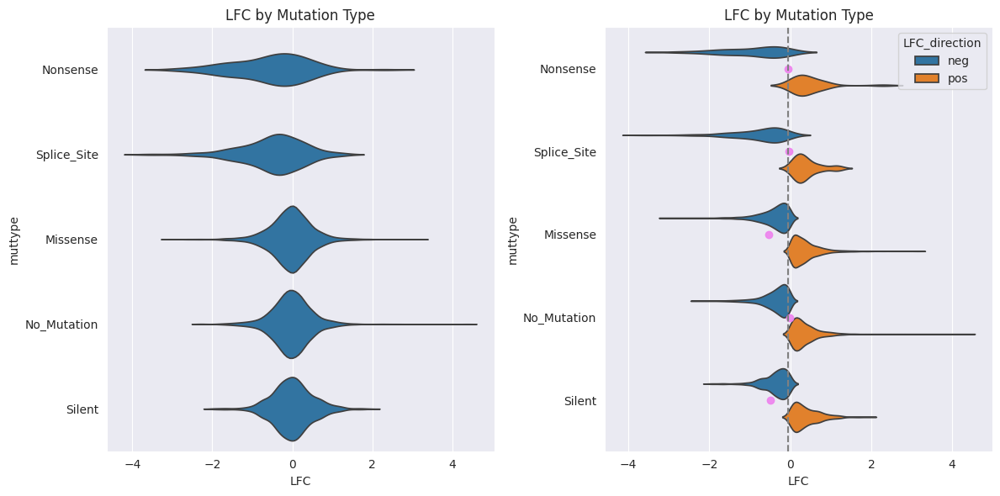

In [17]:
# @markdown Preprocess screen data and QC plots

from beclust3d.preprocess_be_results import parse_base_editing_results

df_inputs = [pd.read_csv(f'{workdir}rawdata/{screen}', sep='\t') for screen in screens]
parse_base_editing_results(
    df_Inputs = df_inputs,
    workdir = workdir, input_gene = input_gene, input_screens = screens,
    mut_col=mut_col, val_col=val_col, gene_col=gene_col, edits_col=edits_col,
    )

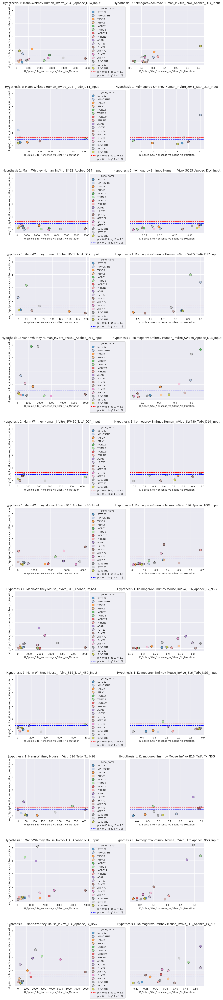

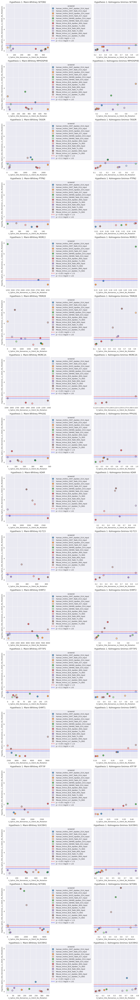

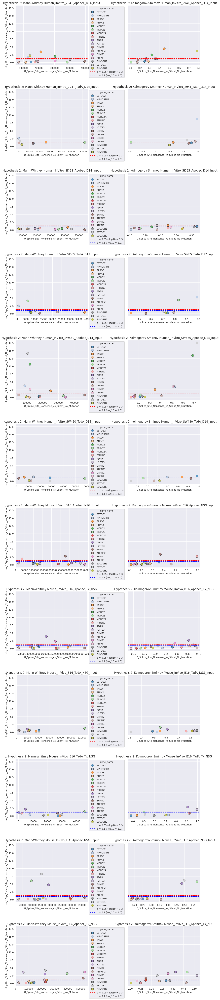

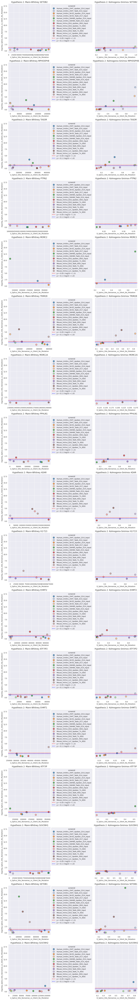

In [18]:
# @markdown Run hypothesis tests

from hypothesis_tests import hypothesis_tests
dfs = [pd.read_csv(f'{workdir}rawdata/{screen}', sep='\t') for screen in screens]

cases = 'Splice,Nonsense' # @param {type:"string"}
controls = 'Silent,No Mutation' # @param {type:"string"}
cases = cases.split(',')
controls = controls.split(',')
comp_name = 'Splice_Site_Nonsense_vs_Silent_No_Mutation' # @param {type:"string"}

hypothesis_tests(
    df_Inputs=dfs,
    workdir=workdir,
    input_gene=input_gene,
    input_screens=screens,
    cases=cases, controls=controls, comp_name=comp_name,
    mut_col=mut_col, val_col=val_col, gene_col=gene_col,
    )

In [20]:
# @markdown Randomize screen data

from beclust3d.randomize_be_results import randomize_be_results

screen_names = [screen.split('.')[0] for screen in screens]
df_missenses = [pd.read_csv(f'{workdir}SETDB1/screendata/{input_gene}_{screen_name}_Missense_edits_list.tsv', sep='\t') for screen_name in screen_names]
for df_missense, screen_name in zip(df_missenses, screen_names):
    randomize_be_results(
        df_missense=df_missense,
        workdir=workdir,
        input_gene=input_gene,
        input_screen=screen_name,
        )

In [7]:
# @markdown Query Uniprot and AlphaFold and process files

from beclust3d.af_structural_features import af_structural_features

af_structural_features(
    workdir=workdir,
    input_gene=input_gene,
    input_uniprot=input_uniprot,
    structureid=structureid
    )

,unipos,unires,x_coord,y_coord,z_coord,bfactor_pLDDT,Naa_count,Naa,Naa_pos,SS9,...,ACC,RSA,exposure,PHI,normPHI,PSI,normPSI,dBurial,normSumdBurial,pLDDT_dis
0,1,M,40.740,39.109,-6.115,36.75,1,S,2,L,...,233,1.04,exposed,360.0,2.00,157.3,0.87,0.00,0.000,very low
1,2,S,37.812,38.895,-3.704,32.83,2,M;S,1;3,L,...,103,0.66,medexposed,35.4,0.20,133.7,0.74,0.38,0.076,very low
2,3,S,35.498,37.485,-2.174,32.79,2,S;L,2;4,L,...,99,0.64,medexposed,179.7,1.00,177.6,0.99,0.40,0.120,very low
3,4,L,32.875,36.126,0.319,42.90,2,S;P,3;5,L,...,165,0.82,exposed,94.0,0.52,156.7,0.87,0.22,0.079,very low
4,5,P,31.112,32.952,1.735,39.74,2,L;G,4;6,L,...,115,0.72,medexposed,-102.6,-0.57,165.8,0.92,0.32,0.090,very low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1286,1287,R,3.341,-6.712,-10.508,85.91,3,C;G;R,1286;1288;1289,L,...,104,0.42,medburied,-63.4,-0.35,-9.9,-0.06,0.62,0.552,confident
1287,1288,G,5.709,-4.495,-12.671,86.20,6,E;D;C;C;R;R,1146;1147;1279;1286;1287;1289,S,...,9,0.09,buried,71.4,0.40,-39.9,-0.22,0.95,0.798,confident
1288,1289,R,2.800,-4.128,-15.192,86.79,7,L;L;C;R;G;L;L,1277;1278;1279;1287;1288;1290;1291,B,...,69,0.28,medburied,-126.4,-0.70,162.4,0.90,0.76,0.616,confident
1289,1290,L,-0.974,-3.633,-15.073,80.70,7,Y;V;L;L;C;R;L,1267;1269;1277;1278;1279;1289;1291,L,...,11,0.05,buried,-104.3,-0.58,-44.6,-0.25,0.99,0.733,confident


/usr/local/lib/python3.10/dist-packages/beclust3d/prioritize_by_conservation.py:130: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 4))


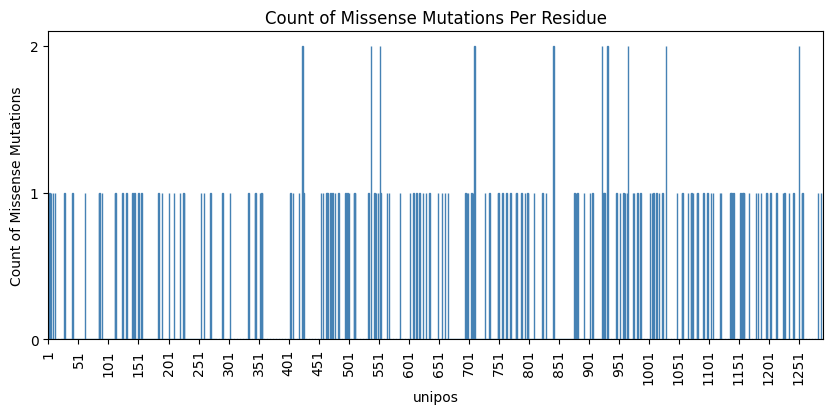

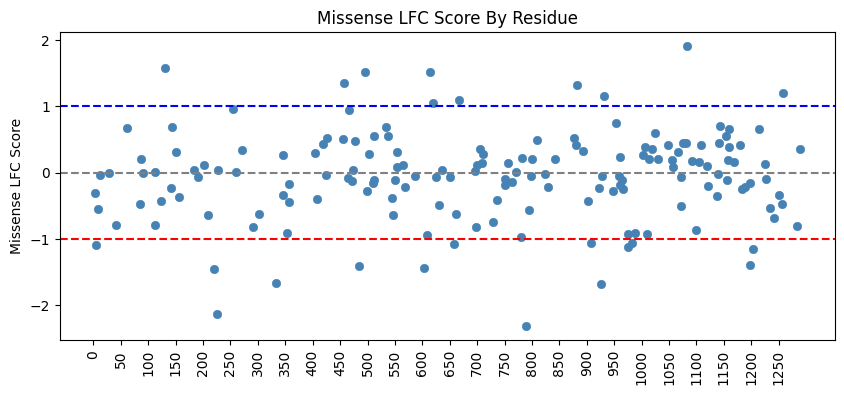

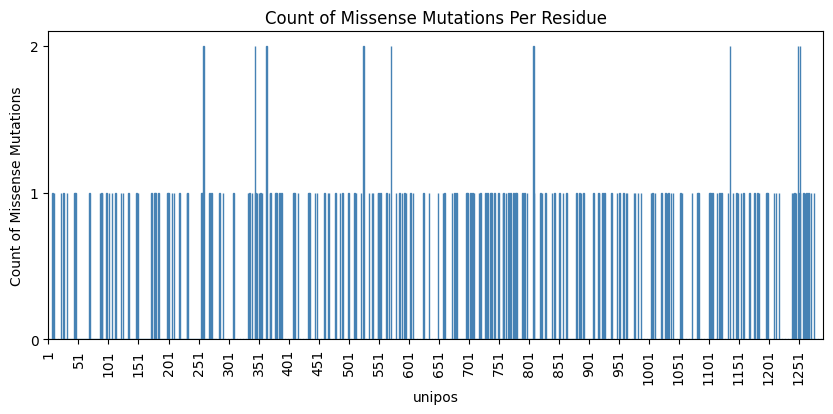

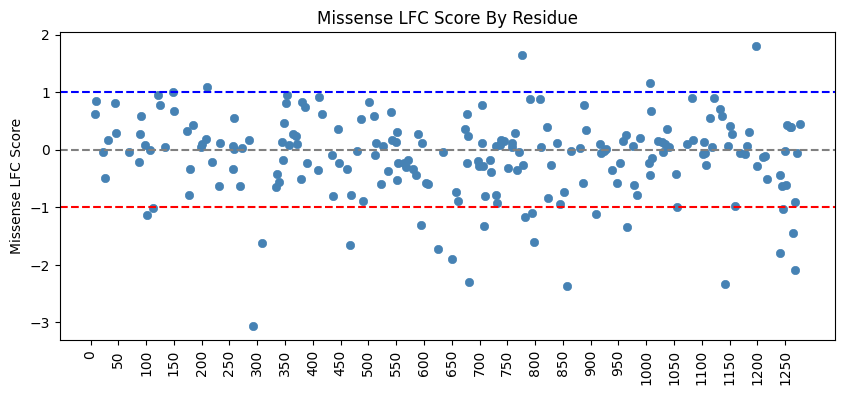

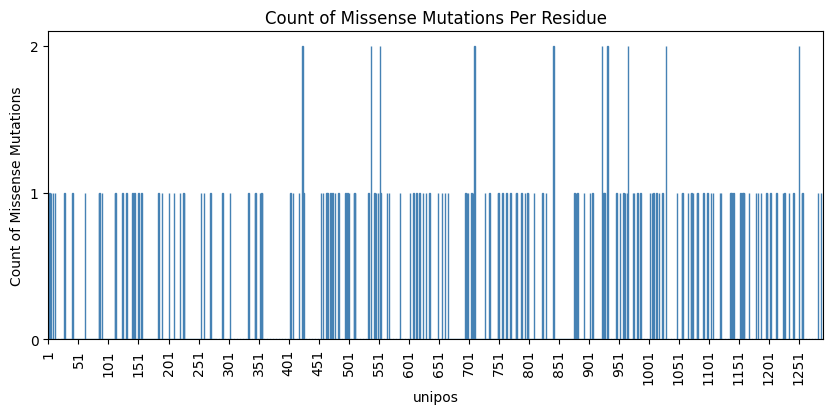

...

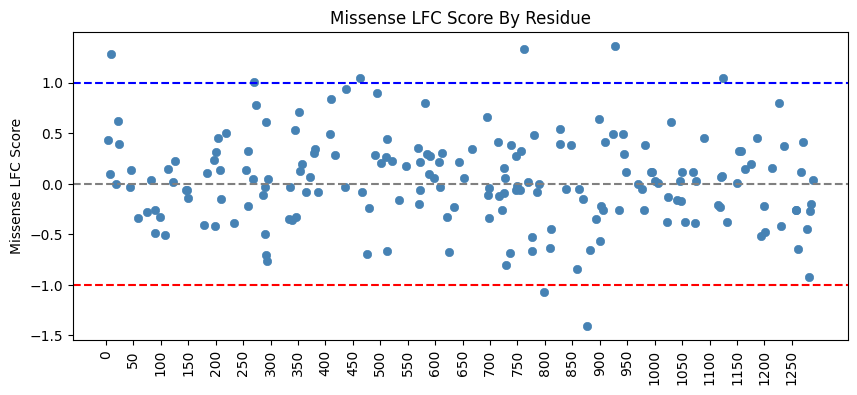

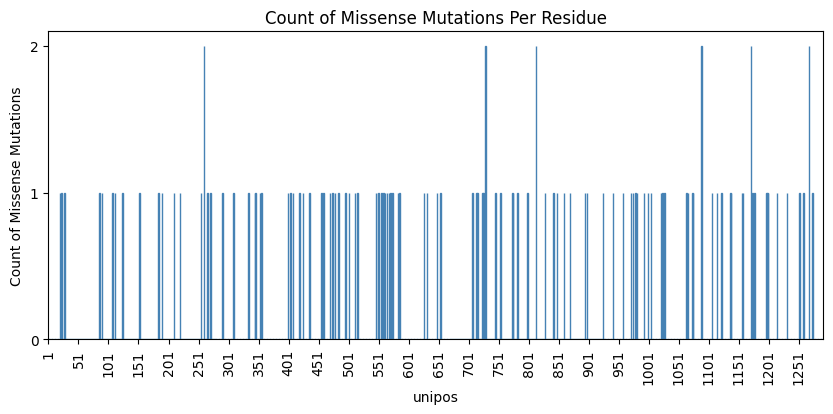

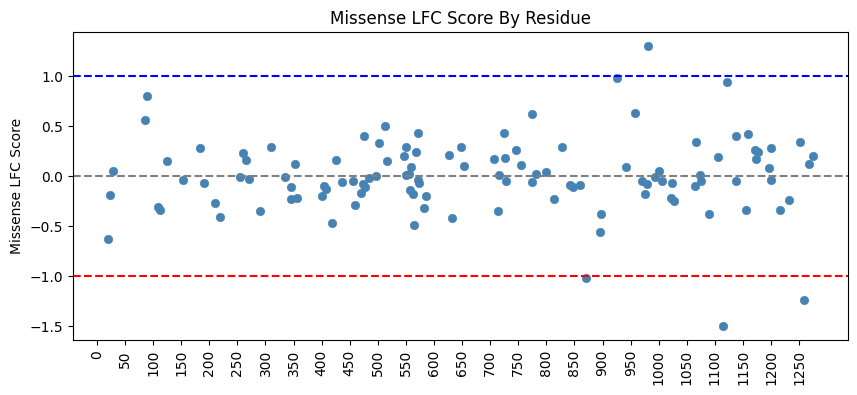

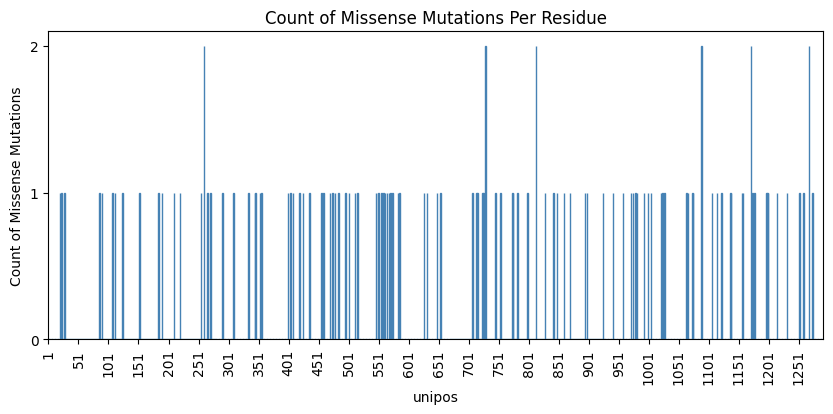

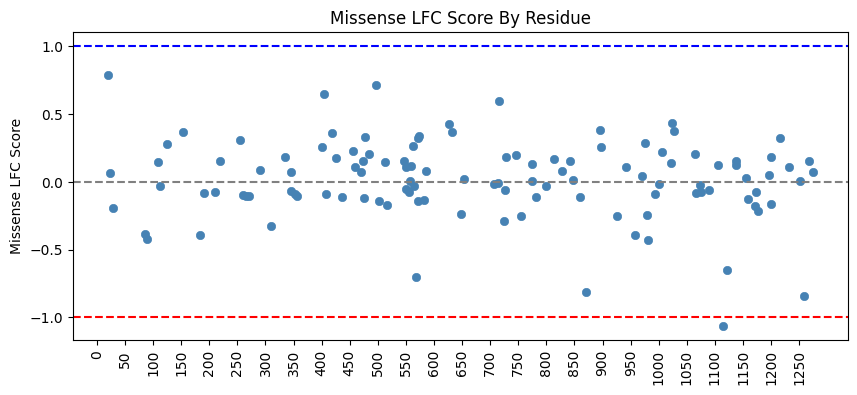

In [9]:
# @markdown Prioritize screen data by conservation \
# @markdown Optional: Query conservation MUSCLE

include_conservation = False #@param {type:"boolean"}

from beclust3d.prioritize_by_conservation import prioritize_by_conservation

df_struc = pd.read_csv(f"{workdir}{input_gene}/{structureid}_coord_struc_features.tsv", sep = "\t")
if include_conservation:
  from beclust3d.conservation import conservation

  # @markdown Optional Inputs
  input_mouse_gene = 'Setdb1' # @param {type:"string"}
  input_mouse_uniid = 'D3YYC3' # @param {type:"string"}
  email = 'xiaohu@g.harvard.edu' # @param {type:"string"}
  title = 'samplejob' # @param {type:"string"}

  df_alignconserv, df_residuemap = conservation(
      workdir=workdir,
      input_human_gene=input_gene, input_mouse_gene=input_mouse_gene,
      input_human_uniid=input_uniprot, input_mouse_uniid=input_mouse_uniid,
      email=email, title=title,
      )

  df_consrv = pd.read_csv(f"{workdir}{input_gene}/Human{input_gene}_MouseSetdb1_residuemap_conservation.tsv", sep = '\t')
else:
  df_consrv = None

for screen in screens:
    out_df = prioritize_by_conservation(
            df_struc     =df_struc,
            df_consrv    =df_consrv,
            workdir      =workdir,
            input_gene   =input_gene,
            input_screen =screen,
            structureid  =structureid,
        )

In [10]:
# @markdown Randomize screen data prioritized by conservation

from beclust3d.randomize_by_conservation import randomize_by_conservation

for screen in screens:
    out_df = randomize_by_conservation(
        workdir      =workdir,
        input_gene   =input_gene,
        input_screen =screen,
        structureid  =structureid,
    )

# Calculate 3D LFC Scores and